# Temperature Forecasting Project

Temperature Data Description : 

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

### Attribute Information: 

#### from above we can see all the information about the dataset lets now import all the essential libraries in Python for Importing the Dataset, EDA, Data Preprocessing, Removing Outliers, Removing Skewness, Dividing the dataset, training and testing the dataset and then to create the model and saving the best model.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import joblib
import warnings
from scipy.stats import zscore, boxcox, yeojohnson
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import LabelEncoder, power_transform, MinMaxScaler, OneHotEncoder, OrdinalEncoder, StandardScaler
from xgboost import XGBRegressor, XGBRFRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
warnings.filterwarnings('ignore')

as we have imported all the essential libraries let us now import the data using pandas.read_csv() and save it in ds variable

In [2]:
ds = pd.read_csv("~/Desktop/Datatrained/Temperature Prediction/temperature.csv")

as we have stored out data in ds variable lets us now look at the data using ds.head() it will show us the first 5 rows of the dataset

In [3]:
ds.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


as we are not able to see all the column name we will use pandas.set_option() to do it

In [4]:
pd.set_option('display.max_columns', None)

as we have done with set option now we will be able to see all the column let us see ds.head() again

In [5]:
ds.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


from above we can see first 5 rows and all the columns in the dataset

lets now look at the shape of the data using ds.shape

In [6]:
r, c = ds.shape
print("Number of rows are {} and columns are {}".format(r, c))

Number of rows are 7752 and columns are 25


from above we can see that there are 7752 rows and 25 columns in the dataset

lets now see the name of the columns using ds.columns

In [7]:
ds.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

lets now look if the dataset has some missing values or not using ds.isnull().sum()

In [8]:
ds.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

from above we can see that there are 20 columns which has missing values we have to fix it for doing further process

lets Visualize this by using seaborn library

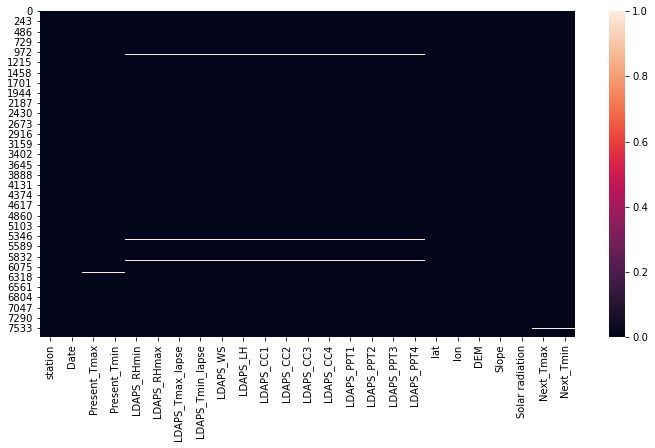

In [9]:
plt.figure(figsize = (12,6))
sns.heatmap(ds.isnull())

from above we can see the exact location and the column name where the missing values are present in the dataset white line represents the missing value

lets us now look at the information about the dataset using ds.info() by which we can understand which datatype the column is

In [10]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


from above we can see that all the columns are of float64 type and only Date column is Object lets us drop date column as it is not Important to us.

In [11]:
ds.drop('Date', 1, inplace = True)

In [12]:
ds.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


from above we can see that we have successfully dropped the date column now lets proceed further

lets us now see the value_counts() of the column so that it will easier for us to understand which type of values should we apply to fill the missing data.

In [13]:
for c in ds.columns:
    print(ds[c].value_counts())

25.0    310
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
13.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64
31.4    112
29.4    111
29.1    108
29.7    107
30.6    105
       ... 
36.4      1
20.7      1
20.4      1
20.3      1
21.2      1
Name: Present_Tmax, Length: 167, dtype: int64
24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.5      1
15.0      1
13.6      1
14.2      1
29.6      1
Name: Present_Tmin, Length: 155, dtype: int64
51.810596    2
71.658089    2
77.030350    2
98.524734    2
19.794666    2
            ..
44.005089    1
58.655628    1
58.761993    1
42.186558    1
71.359451    1
Name: LDAPS_RHmin, Length: 7672, dtype: int64
58.936283    2
96.525200    2
91.776146    2
88.876610    2
92.531029    2
            ..
83.450928    1


In [14]:
ds.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

lets us see the outliers in the data for understanding which method should we use for fixing the NaN values 

In [15]:
zscr = np.abs(zscore(ds))
threshold = 3
print(np.where(zscr>3))

(array([], dtype=int64), array([], dtype=int64))


from above we can see that there is no values 3 STD above snd below the mean so we can use median and mean to fix the NaN values

from above we can see that for Station there is only 25 values so we have to put one of those values to fill the Missing values we will use the median value for Station column and rest all the columns can be fitted by using mean, median as rest of the values are not having outliers

let us now fix the NaN values column one by one

In [16]:
ds.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

lets fix the station column using median value of that column

In [17]:
ds['station'].fillna(ds['station'].median(), inplace = True)

In [18]:
ds['station'].value_counts()

13.0    312
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
25.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64

from above we can see that we have fixed the NaN value of Station column using 13 as the values has incremented from 310 to 312

lets now fix the other columns using mean

In [19]:
ds.iloc[:,-2:]

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7747,28.3,18.1
7748,28.6,18.8
7749,27.8,17.4
7750,17.4,11.3


In [20]:
col = ds.iloc[:,1:17]
col1 = ds.iloc[:, -2:]

In [21]:
for c in col:
    ds[c].fillna(ds[c].mean(), inplace = True)
    for c1 in col1:
        ds[c1].fillna(ds[c1].mean(), inplace = True)

lets now see the null values in all the columns

In [22]:
ds.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

from above we can see that we have fixed all the columns which had NaN values

In [23]:
ds.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


lets now see the Stastical Description of the dataset using ds.describe()

In [24]:
ds.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.210637,2.956557,2.403036,14.596973,7.157124,2.932898,2.333973,2.173245,33.567001,0.261185,0.256810,0.249148,0.253114,1.936331,1.754258,1.156174,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,0.315667,0.265264,0.232354,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.067593,0.024276,0.009697,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


lets see its graphical representation using Seaborn

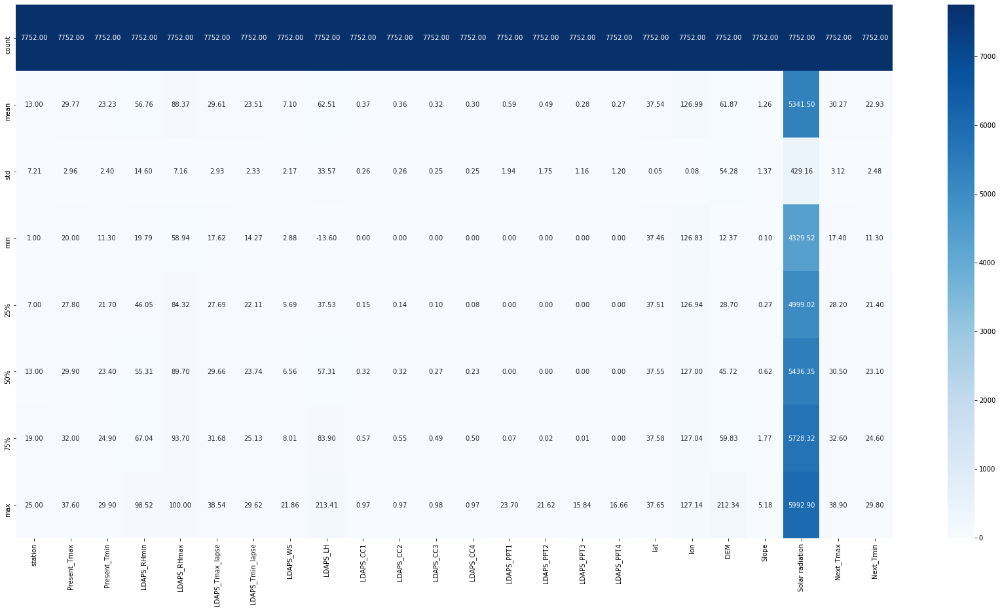

In [25]:
plt.figure(figsize = (30,15))
sns.heatmap(ds.describe(), annot=True, fmt='.2f', cmap='Blues')

from here we can see that solar radition has some huge values so we will fix it later rest all our valeus are good clean values

### lets Start with EDA Process

In [26]:
ds.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


lets visualize the column one by one

In [27]:
def uni(col):
    plt.figure(figsize = (12,6))
    sns.scatterplot(ds[col], ds.index)

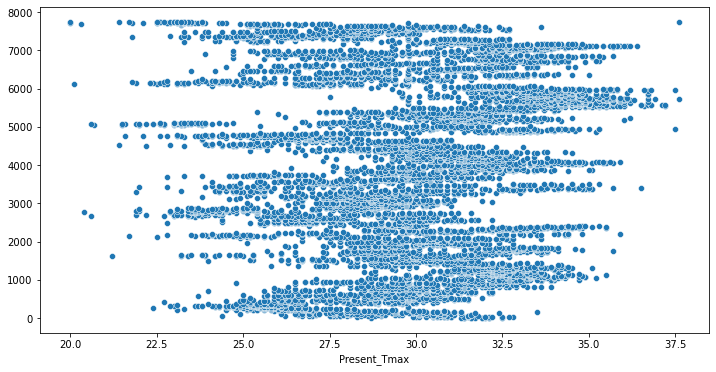

In [28]:
uni('Present_Tmax')

from above we can see the distribution of temperature with maximum as 37.5 and minimum is near to 20

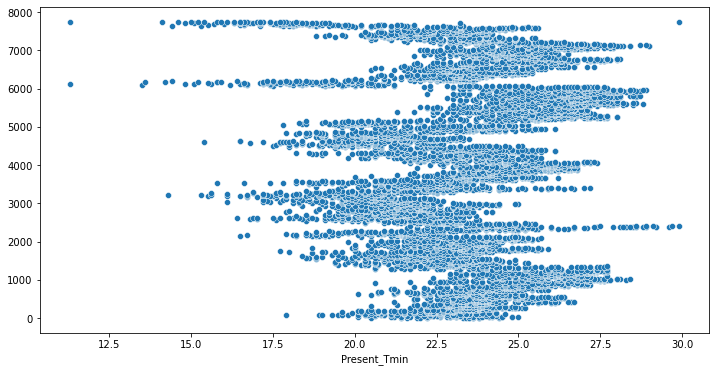

In [29]:
uni('Present_Tmin')

from here we can see the minimum temperature is below 12.5 and maximum is 30

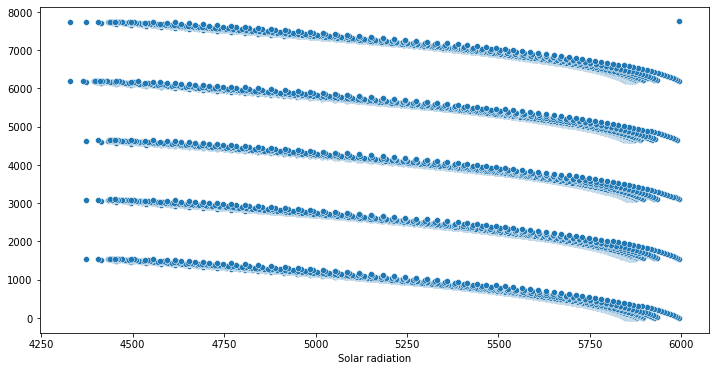

In [30]:
uni('Solar radiation')

from above we can see the solar radiation

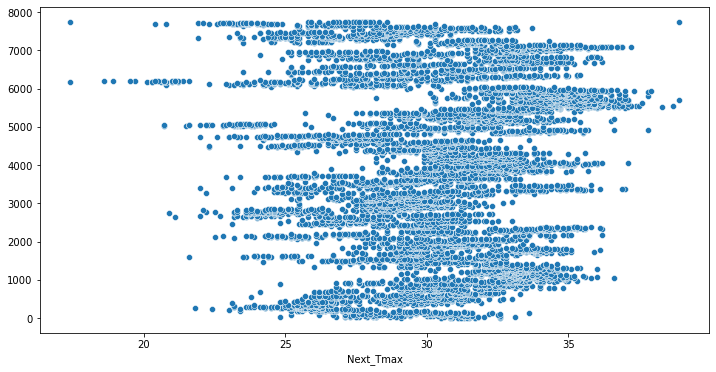

In [31]:
uni('Next_Tmax')

from above we can see the predicted Temperature max representation

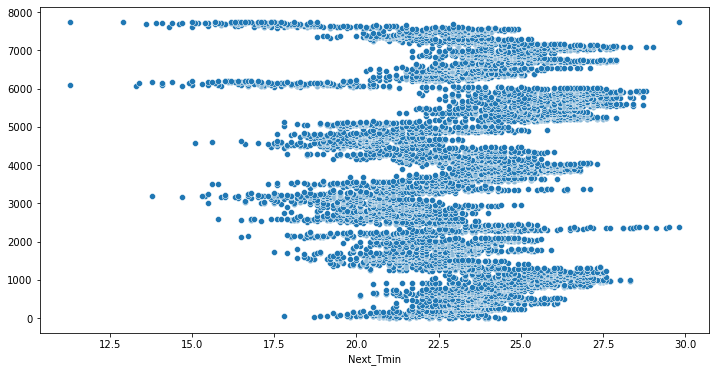

In [32]:
uni('Next_Tmin')

from here we can see the Predicted temperature min

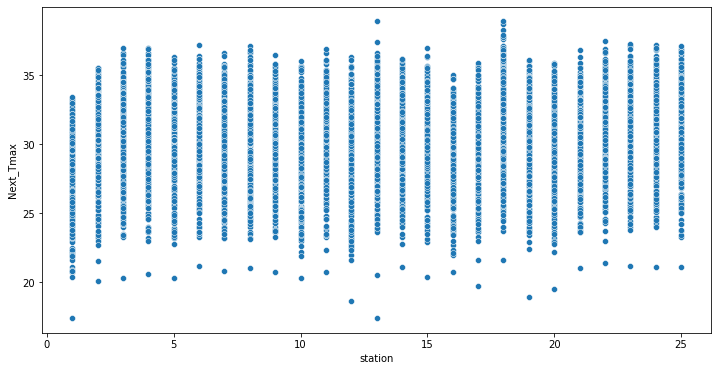

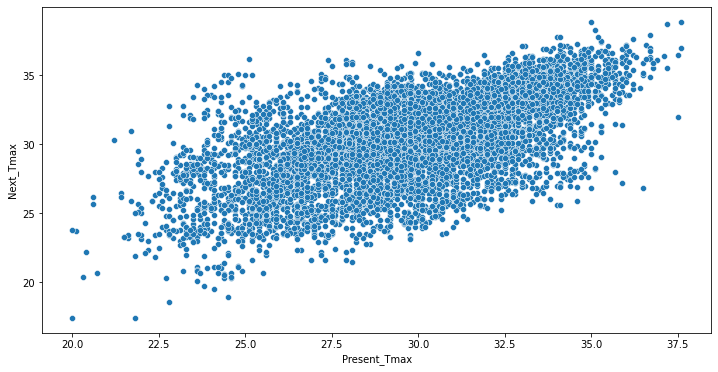

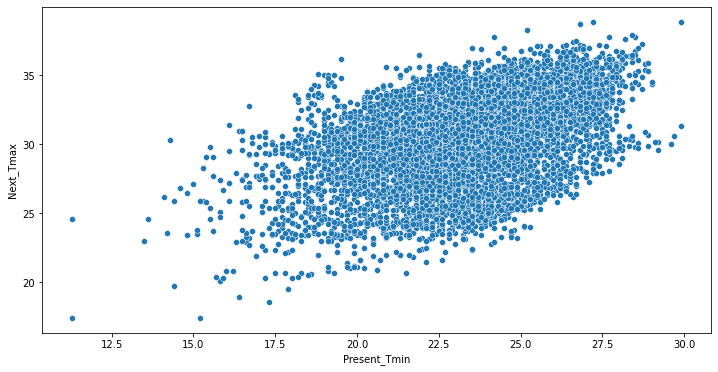

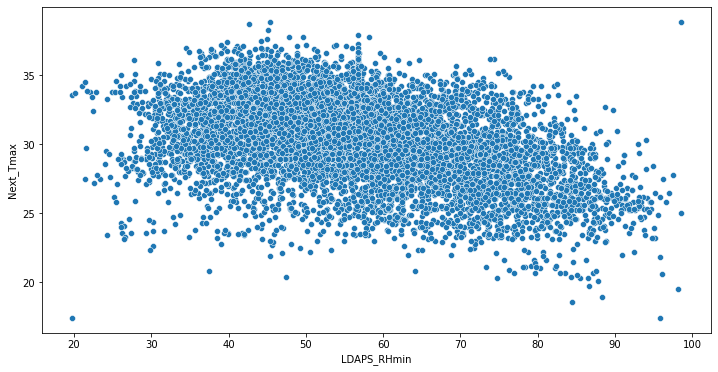

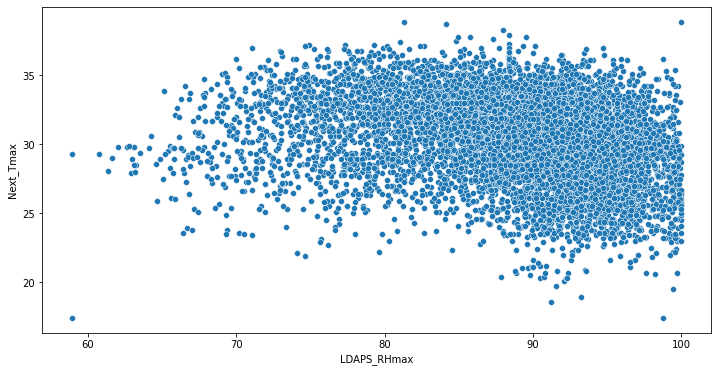

...

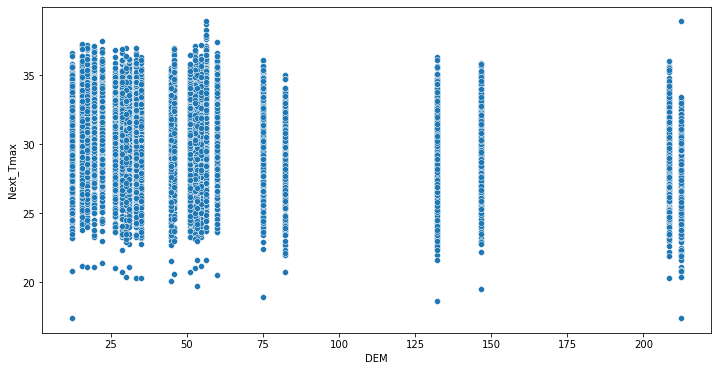

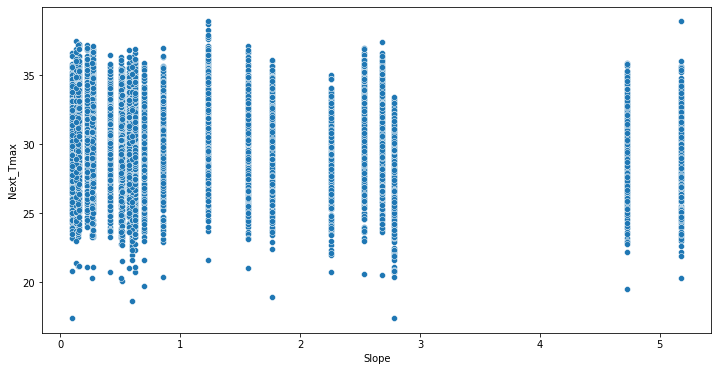

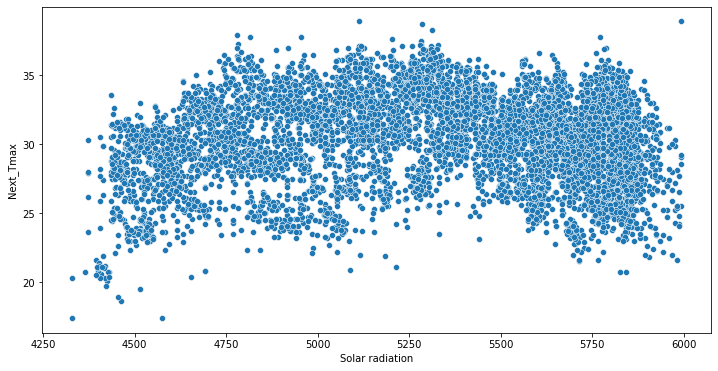

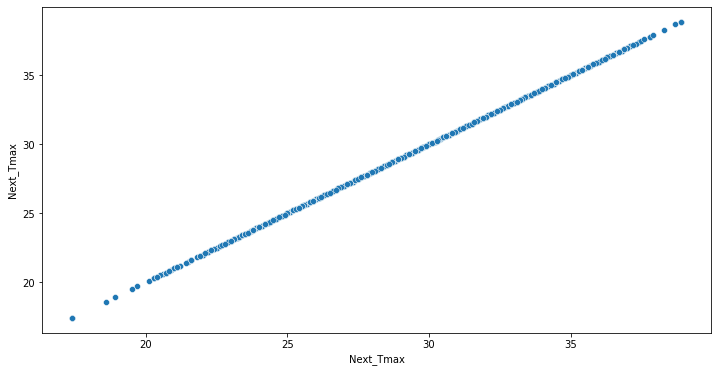

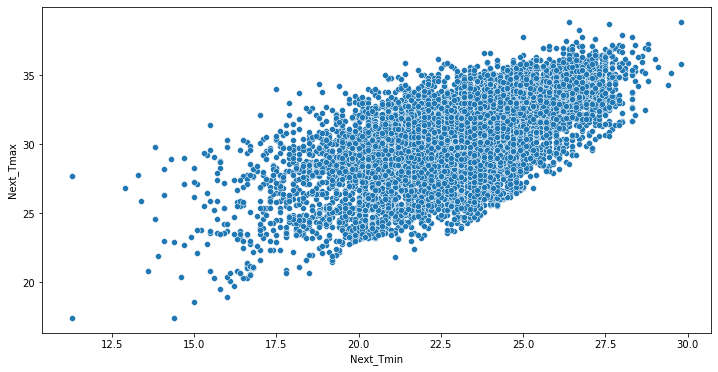

In [33]:
for i in ds.columns:
    plt.figure(figsize = (12,6))
    sns.scatterplot(ds[i], ds['Next_Tmax'])

lets now see the visualization for Next Tmin

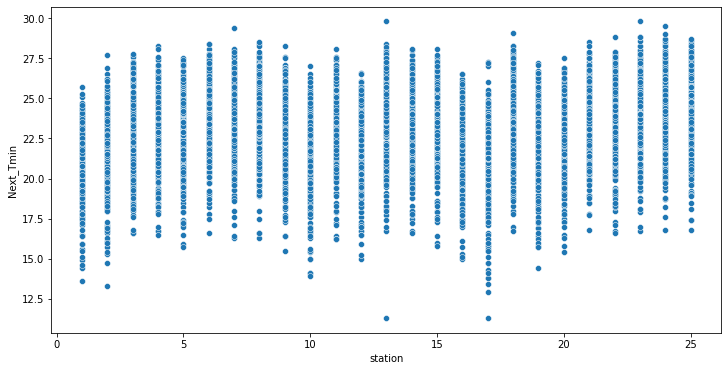

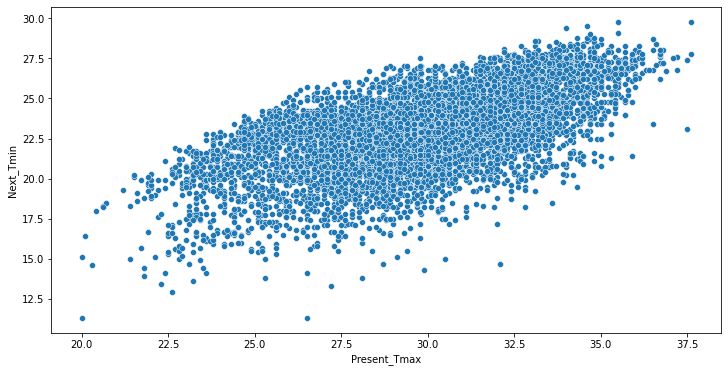

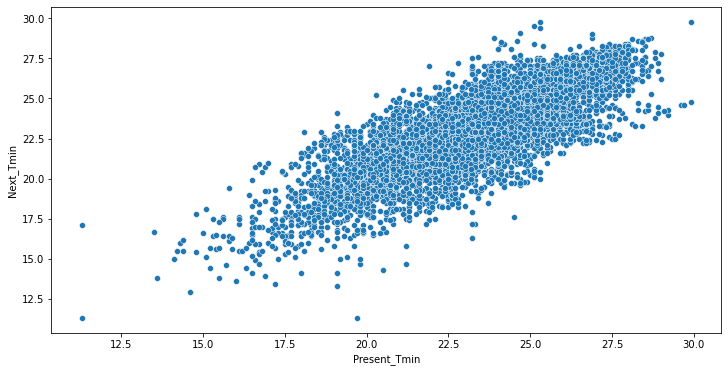

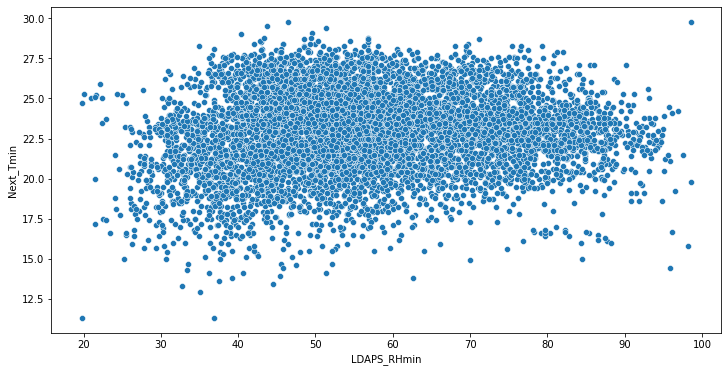

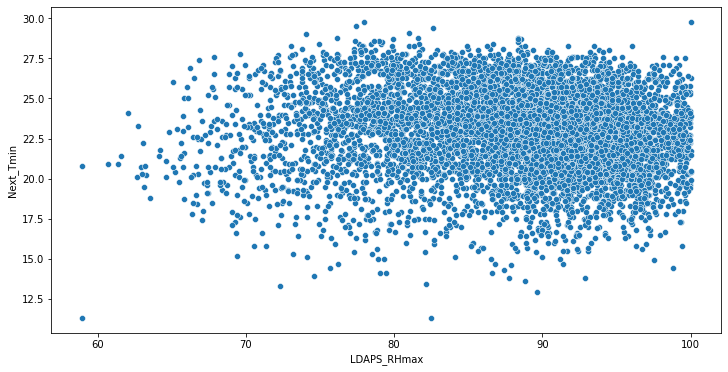

...

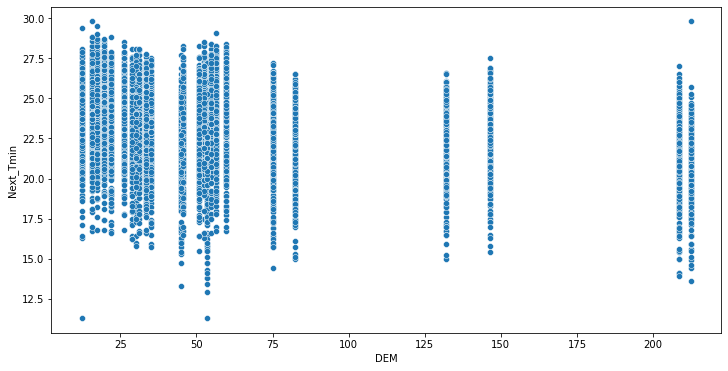

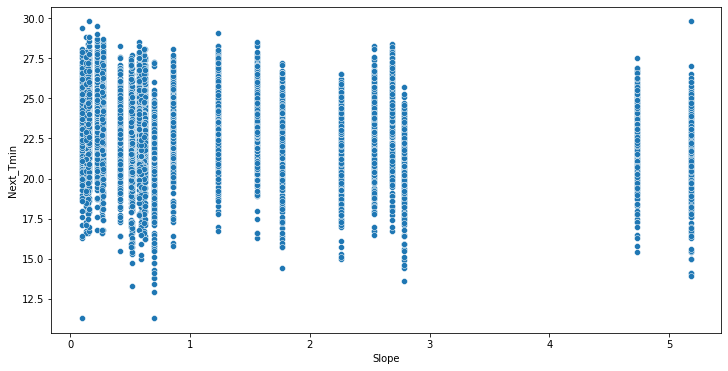

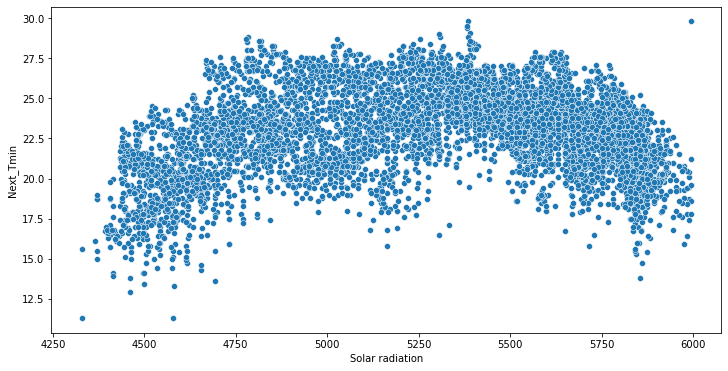

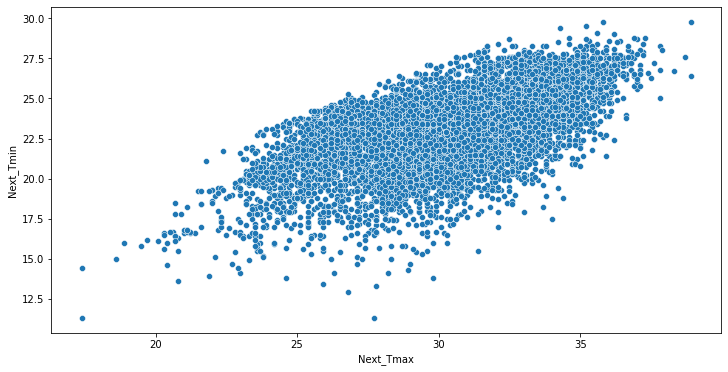

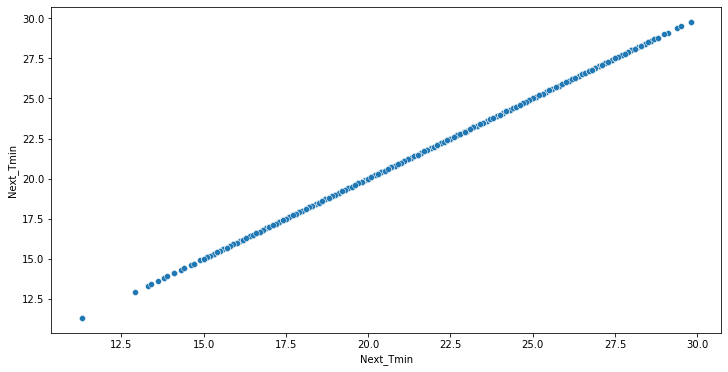

In [34]:
for i in ds.columns:
    plt.figure(figsize = (12,6))
    sns.scatterplot(ds[i], ds['Next_Tmin'])

lets us now see some more graphs

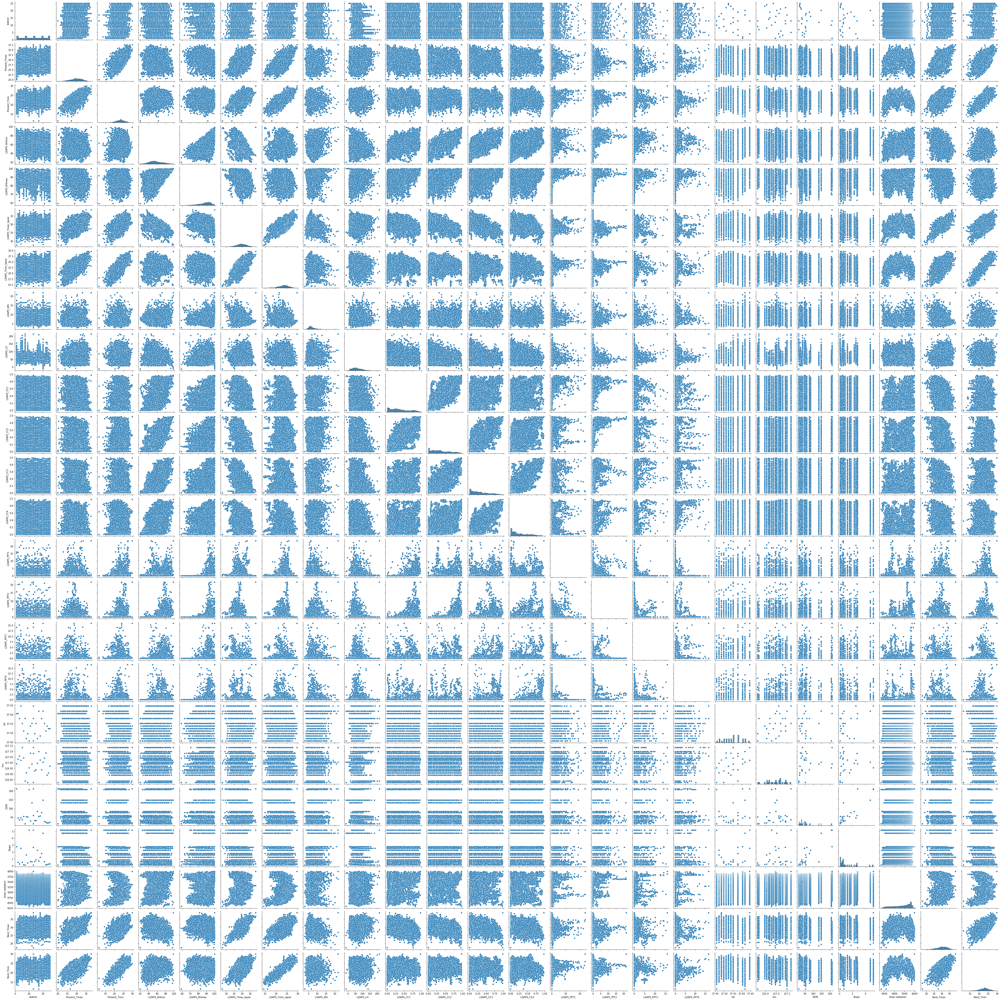

In [35]:
sns.pairplot(ds)

from above we can see all the possible graphs

In [36]:
ds.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

lets now see the skewness of data

In [37]:
ds.skew()

station             0.000000
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.855015
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.581763
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
Next_Tmin          -0.404447
dtype: float64

lets see the skewness using density plot

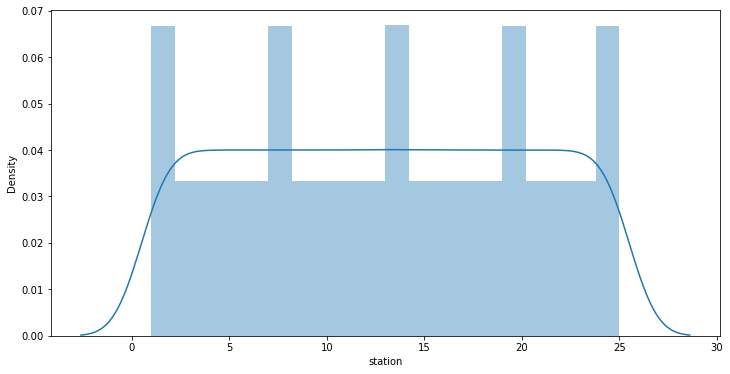

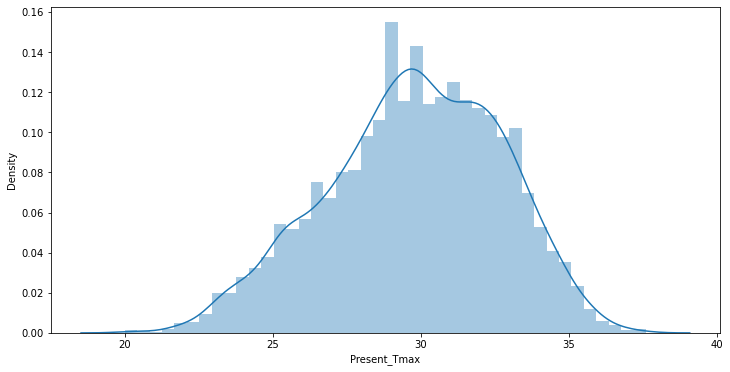

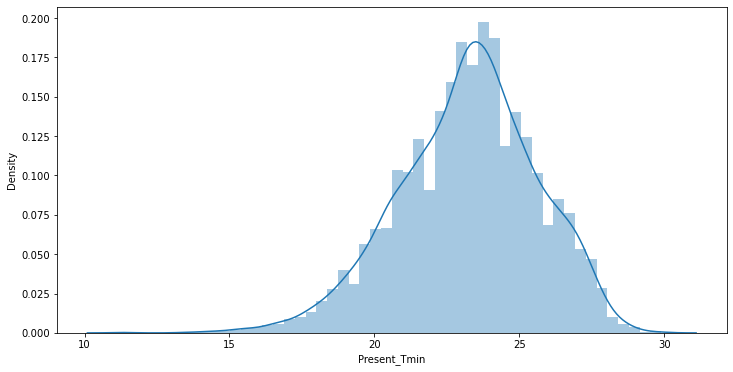

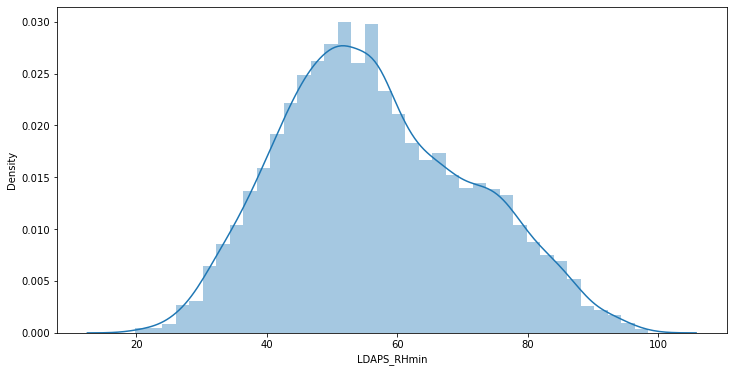

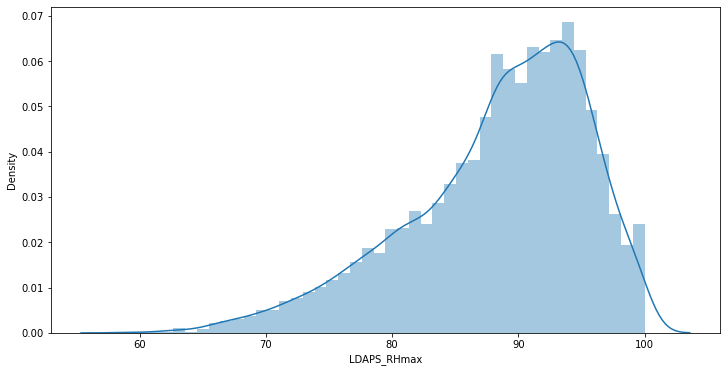

...

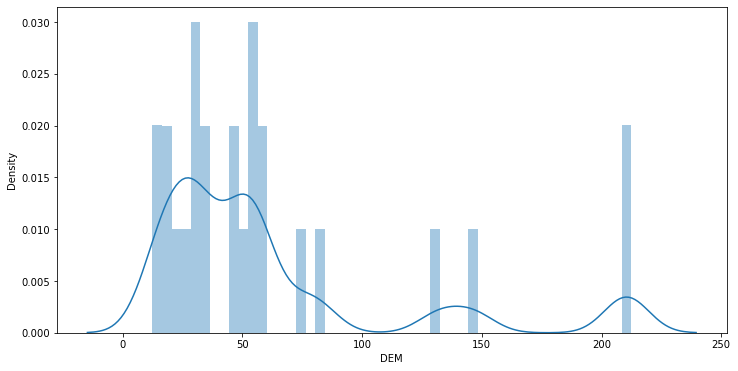

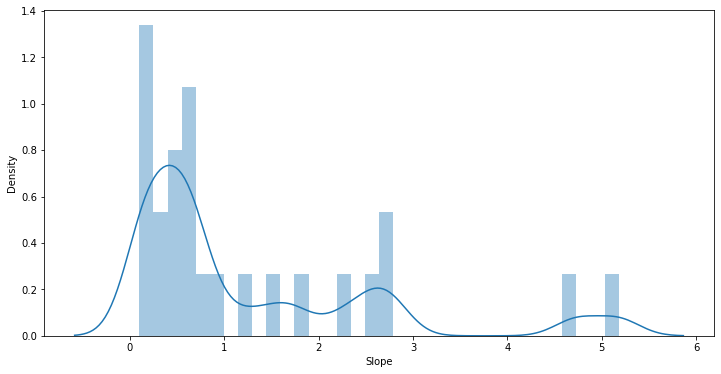

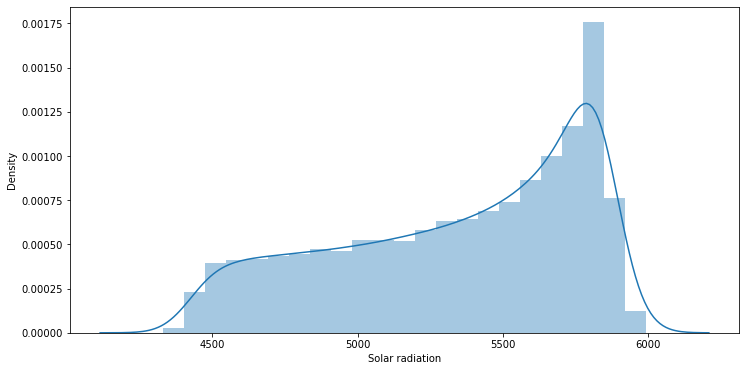

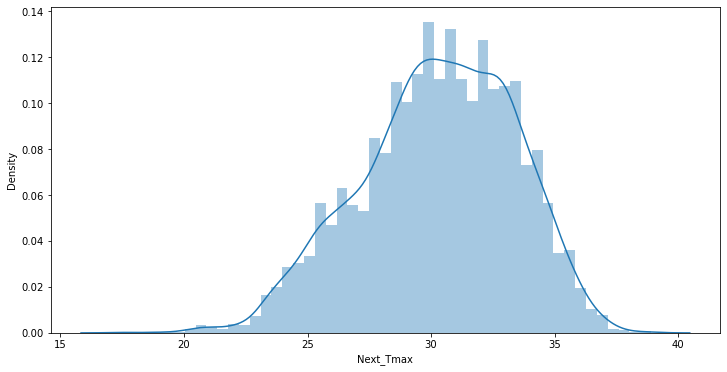

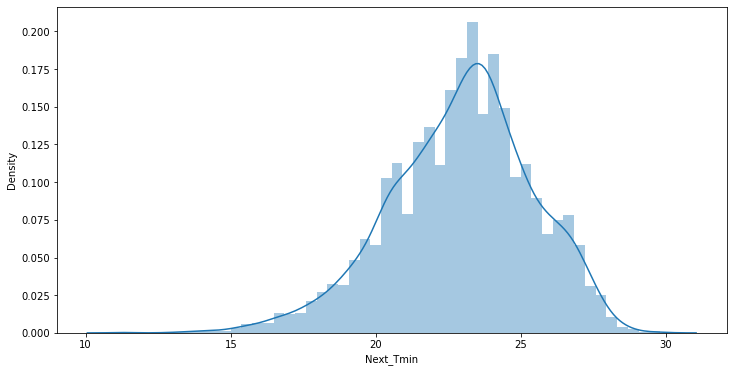

In [38]:
for i in ds.columns:
    plt.figure(figsize = (12,6))
    sns.distplot(ds[i])

from above we can see that the data is right skewed and left skewed

here we will take threshold skewness as +/- 0.5 lets fix all the skewness which is more than +/- 0.5

In [39]:
for c in ds.columns:
    if ds[c].skew() >= 0.5 or ds[c].skew() < -0.5:
        ds[[c]] = power_transform(ds[[c]])
        ds[[c]] = pd.DataFrame(ds[[c]], columns = ds[[c]].columns)
    if ds[c].skew() >= 0.5 or ds[c].skew() < -0.5:
        ds[[c]] = power_transform(ds[[c]])
        ds[[c]] = pd.DataFrame(ds[[c]], columns = ds[[c]].columns)

by using power_transformation we have fixed the skewness of the data

now lets seperate our dependent and independent variable

In [40]:
X = ds.iloc[:,:22]

In [41]:
Y = ds.iloc[:,-2:]

As we have seperated our independent and independent variable we will now be doing standard scaler to our independent variable

In [42]:
sc = StandardScaler()

In [43]:
X_new = sc.fit(X)
X_new = sc.fit_transform(X)

In [44]:
X_new = pd.DataFrame(X_new, columns = X.columns)

In [45]:
X_new

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.664315,-0.361326,-0.759529,0.102515,0.272915,-0.524889,-0.312411,0.093387,0.310382,-0.516243,-0.592636,-0.541852,-0.584801,-0.651566,-0.611379,-0.595808,-0.534986,1.189286,-0.005000,1.834978,1.314153,1.849430
1,-1.525622,0.721084,-0.676296,-0.308027,0.185831,0.080895,0.144368,-0.625565,-0.211695,-0.548557,-0.406199,-0.554289,-0.603593,-0.651566,-0.611379,-0.595808,-0.534986,1.189286,0.511177,0.055979,-0.385336,1.400702
2,-1.386929,0.619608,0.031188,-0.552814,-0.773454,0.162936,0.394571,-0.314874,-1.375126,-0.610450,-0.384009,-0.317480,-0.520112,-0.651566,-0.611379,-0.595808,-0.534986,0.653021,0.838510,-0.364575,-0.949164,1.380650
3,-1.248236,0.754909,0.072805,0.101426,1.316777,0.031092,-0.174463,-0.656732,0.204179,-0.583539,-0.506548,-0.544825,-0.565449,-0.651566,-0.611379,-0.595808,-0.534986,1.991696,0.385280,0.084879,1.235263,1.357783
4,-1.109544,0.551957,-0.551446,-0.040098,0.110968,-0.170325,-0.103881,-0.593836,1.300503,-0.832287,-0.413115,-0.448666,-0.365736,-0.651566,-0.611379,-0.595808,-0.534986,0.118743,1.807917,-0.290442,-0.401730,1.366748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,1.386929,-2.187892,-2.549048,-2.056591,-1.326845,-1.112066,-1.831134,-0.307886,0.383363,-1.297018,-1.071078,-1.595889,-1.480634,-0.651566,-0.611379,-0.595808,-0.534986,-0.149390,-1.263971,-1.578128,-1.280447,-1.754608
7748,1.525622,-2.187892,-2.299348,-2.241619,-1.470235,-0.887662,-1.843546,-0.063701,-0.363041,-1.274658,-1.094726,-1.595889,-1.480634,-0.651566,-0.611379,-0.595808,-0.534986,-0.417522,-1.037356,-1.400633,-1.072947,-1.760631
7749,1.664315,-2.221718,-2.424198,-2.317504,-1.474702,-0.570780,-1.904782,0.337939,-1.973052,-1.224577,-1.153504,-1.595889,-1.474280,-0.651566,-0.611379,-0.595808,-0.534986,-0.417522,-0.269384,-1.193124,-0.935044,-1.744763
7750,0.000000,-3.304127,-4.962817,-2.532517,-2.459357,-4.087857,-2.891504,-4.119648,-7.414001,-1.412018,-1.386643,-1.595889,-1.480634,-0.651566,-0.611379,-0.595808,-0.534986,-1.758184,-2.082302,-1.985144,-1.477264,-1.887071


from above we can see that we have we have successfully scaled all our values

now let us split the data into traning and testing dataset using train_test_split

In [46]:
X_train, X_test, Y_train, Y_test = train_test_split(X_new, Y, test_size = 0.22, random_state = 42)

we are now using random_state as 42 and after this we will find the best random state

In [47]:
lr = LinearRegression()
lr.fit(X_train, Y_train)
predlr = lr.predict(X_test)
acclr = r2_score(Y_test, predlr)
print("Accuracy Score:", acclr)

Accuracy Score: 0.8000681370135404


from above we can see that we have got accuracy of 80% now lets find the best random state 

In [48]:
models = [LinearRegression(), Lasso(), Ridge(), ElasticNet(), DecisionTreeRegressor(), RandomForestRegressor(), KNeighborsRegressor()]

we will be using above mentioned model as other don't support multiple target varible

In [49]:
maxacc = 0
maxrs = 0
model = 0
for i in range(1,1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X_new, Y, test_size = 0.22, random_state = i)
    for m in models:
        m.fit(X_train, Y_train)
        pred = m.predict(X_test)
        acc = r2_score(Y_test, pred)
        if acc > maxacc:
            maxacc = acc
            maxrs = i
            model = m
            
print("Maximum Accuracy is {} at Random State {} for model {}".format(maxacc, maxrs, model))

Maximum Accuracy is 0.9066199777144155 at Random State 942 for model RandomForestRegressor()


we are getting 91% Accuracy Score at random score 942 lets find out all the models performance at random_state 942

In [50]:
X_train, X_test, Y_train, Y_test = train_test_split(X_new, Y, test_size = 0.22, random_state = 942)

In [51]:
X = X_new

In [52]:
print("Linear Regression")
lr = LinearRegression()
lr.fit(X_train, Y_train)
predlr = lr.predict(X_test)
acclr = r2_score(Y_test, predlr)*100
print("Accuracy Score:", acclr)
print("Mean Squared Error:", mean_squared_error(Y_test, predlr))
print("Mean Absolute Error:", mean_absolute_error(Y_test, predlr))
scorelr = cross_val_score(lr, X, Y, cv = 5)
scorelr = scorelr.mean()*100
print("Cross Validation Score", scorelr)

Linear Regression
Accuracy Score: 79.69875155439223
Mean Squared Error: 1.716404132479087
Mean Absolute Error: 0.9810181005045113
Cross Validation Score 72.75824718996202


In [53]:
print('Lasso Regression')
las = Lasso()
las.fit(X_train, Y_train)
predlas = las.predict(X_test)
acclas = r2_score(Y_test, predlas)*100
print("Accuarcy Score:", acclas)
print("Mean Squared Error:", mean_squared_error(Y_test, predlas))
print("Mean Abosute Error:", mean_absolute_error(Y_test, predlas))
scorelas= cross_val_score(las, X, Y, cv = 5)
scorelas = scorelas.mean()*100
print("Cross Validation Score",scorelas)

Lasso Regression
Accuarcy Score: 60.29673957389561
Mean Squared Error: 3.2717245766209566
Mean Abosute Error: 1.4153592039685592
Cross Validation Score 54.651949591557724


In [54]:
print("Ridge Regression")
reg = Ridge()
reg.fit(X_train, Y_train)
predreg = reg.predict(X_test)
accreg = r2_score(Y_test, predreg)*100
print("Accuracy Score:", accreg)
print("Mean Squared Error:", mean_squared_error(Y_test, predreg))
print("Mean Absolute Error:", mean_absolute_error(Y_test, predreg))
scorereg = cross_val_score(reg, X, Y, cv = 5)
scorereg = scorereg.mean()*100
print("Cross Validation Score",scorereg)

Ridge Regression
Accuracy Score: 79.69809643441117
Mean Squared Error: 1.7164643827804489
Mean Absolute Error: 0.9810300030281611
Cross Validation Score 72.76010176298968


In [55]:
print("Elastic Net")
elas = ElasticNet()
elas.fit(X_train, Y_train)
predelas = elas.predict(X_test)
accelas = r2_score(Y_test, predelas)*100
print("Accuracy Score:", acclas)
print("Mean Squared Error:", mean_squared_error(Y_test, predelas))
print("Mean Abosulte Error:", mean_absolute_error(Y_test, predelas))
scoreelas = cross_val_score(elas, X, Y, cv = 5)
scoreelas = scoreelas.mean()*100
print("Cross Validation Score",scoreelas)

Elastic Net
Accuracy Score: 60.29673957389561
Mean Squared Error: 2.8644836542898577
Mean Abosulte Error: 1.3258136613448355
Cross Validation Score 59.17192966958697


In [56]:
print("Decision Tree")
dtr = DecisionTreeRegressor()
dtr.fit(X_train, Y_train)
predtr = dtr.predict(X_test)
accdtr = r2_score(Y_test, predtr)*100
print("Accuracy Score", accdtr)
print("Mean Squared Error:", mean_squared_error(Y_test, predtr))
print("Mean Absolute Error:", mean_absolute_error(Y_test, predtr))
scoredtr = cross_val_score(dtr, X, Y, cv = 5)
scoredtr = scoredtr.mean()*100
print("Cross Validation Score:", scoredtr)

Decision Tree
Accuracy Score 76.04820392888966
Mean Squared Error: 1.96562362150638
Mean Absolute Error: 1.0093074168079899
Cross Validation Score: 43.45414327141594


In [57]:
print("Random Forest Regressor")
rfr = RandomForestRegressor()
rfr.fit(X_train, Y_train)
predrfr = rfr.predict(X_test)
accrfr = r2_score(Y_test, predrfr)*100
print("Accuracy Score", accrfr)
print("Mean Squared Error:", mean_squared_error(Y_test, predrfr))
print("Mean Absolute Error:", mean_absolute_error(Y_test, predrfr))
scorerfr = cross_val_score(rfr, X, Y, cv = 5)
scorerfr = scorerfr.mean()*100
print("Cross Validation Score:", scorerfr)

Random Forest Regressor
Accuracy Score 90.71515490845054
Mean Squared Error: 0.7597963624066965
Mean Absolute Error: 0.6564300052356613
Cross Validation Score: 71.10231533471067


In [58]:
print("KNeighbours")
knn = KNeighborsRegressor()
knn.fit(X_train, Y_train)
predknn = knn.predict(X_test)
accknn = r2_score(Y_test, predknn)*100
print("Accuracy Score:", accknn)
print("Mean Squared Error:", mean_squared_error(Y_test, predknn))
print("Mean Absolute Error:", mean_absolute_error(Y_test, predknn))
scoreknn = cross_val_score(knn, X, Y, cv = 5)
scoreknn = scoreknn.mean()*100
print("Cross Validation score:", scoreknn)

KNeighbours
Accuracy Score: 86.11682605462086
Mean Squared Error: 1.141090024244353
Mean Absolute Error: 0.8032205814619621
Cross Validation score: 58.088845366516196


In [59]:
Compare = {
    'Model Name':['Linear Regression', 'Lasso', 'Ridge', 'ElasticNet', 'Decision Tree', 'Random Forest', 'KNeighbours'],
    'Accuracy Score':[acclr, acclas, accreg, accelas, accdtr, accrfr, accknn],
    'Cross Validation Score':[scorelr, scorelas, scorereg, scoreelas, scoredtr, scorerfr, scoreknn],
    'Accuracy Score - Cross Validation Score':[acclr-scorelr,acclas-scorelas,accreg-scorereg,accelas-scoreelas,accdtr-scoredtr,accrfr-scorerfr,accknn-scoreknn]
}

In [60]:
compare = pd.DataFrame.from_dict(Compare)

In [61]:
compare

,Model Name,Accuracy Score,Cross Validation Score,Accuracy Score - Cross Validation Score
0,Linear Regression,79.698752,72.758247,6.940504
1,Lasso,60.296740,54.651950,5.644790
2,Ridge,79.698096,72.760102,6.937995
3,ElasticNet,65.452860,59.171930,6.280930
4,Decision Tree,76.048204,43.454143,32.594061
5,Random Forest,90.715155,71.102315,19.612840
6,KNeighbours,86.116826,58.088845,28.027981


lets now see how the models perform after GridSearchCV

In [62]:
parameterlr = {
    'n_jobs':[1,2,3,4,5,6,7]
}

In [63]:
parameterreg = {
    'alpha':[1,2,3,4,5],
    'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

In [64]:
parameterlas = {
    'alpha':[1e-15, 1e-10, 1e-8, 1e-5,1e-4, 1e-3,1e-2, 1, 5, 10],
    'selection':['cyclic','random']
}

In [65]:
parameterdtr = {
    'criterion':['mse', 'friedman_mse', 'mae', 'poisson'],
    'splitter':['best','random'],
    'max_depth':[1,2,3,4]
}

In [66]:
parameterknn = {
    'n_neighbors':[1,2,3,4],
    'weights':['uniform', 'distance'],
    'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
    'n_jobs':[1,2,3,4]
}

In [67]:
parameterrfr = {
    'n_estimators':[1,2,3,4],
    'criterion':['mse','mae'],
    'max_depth':[1,2,3]
}

In [68]:
gscvlr = GridSearchCV(lr, parameterlr)
gscvlas = GridSearchCV(las, parameterlas)
gscvreg = GridSearchCV(reg, parameterreg)
gscvdtr = GridSearchCV(dtr, parameterdtr)
gscvknn = GridSearchCV(knn, parameterknn)
gscvrfr = GridSearchCV(rfr, parameterrfr)

In [69]:
gscvlr.fit(X_train, Y_train)

GridSearchCV(estimator=LinearRegression(),
             param_grid={'n_jobs': [1, 2, 3, 4, 5, 6, 7]})

In [70]:
gscvlas.fit(X_train, Y_train)

GridSearchCV(estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10],
                         'selection': ['cyclic', 'random']})

In [71]:
gscvreg.fit(X_train, Y_train)

GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': [1, 2, 3, 4, 5],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga']})

In [72]:
gscvdtr.fit(X_train, Y_train)

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae', 'poisson'],
                         'max_depth': [1, 2, 3, 4],
                         'splitter': ['best', 'random']})

In [73]:
gscvknn.fit(X_train, Y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_jobs': [1, 2, 3, 4], 'n_neighbors': [1, 2, 3, 4],
                         'weights': ['uniform', 'distance']})

In [74]:
gscvrfr.fit(X_train, Y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [1, 2, 3],
                         'n_estimators': [1, 2, 3, 4]})

In [75]:
gscv_predictlr = gscvlr.best_estimator_.predict(X_test)

In [76]:
gscv_predictlas = gscvlas.best_estimator_.predict(X_test)

In [77]:
gscv_predictreg = gscvreg.best_estimator_.predict(X_test)

In [78]:
gscv_predictdtr = gscvdtr.best_estimator_.predict(X_test)

In [79]:
gscv_predictrfr = gscvrfr.best_estimator_.predict(X_test)

In [80]:
gscv_predictknn = gscvknn.best_estimator_.predict(X_test)

In [81]:
print("Linear Regression Accuracy:", r2_score(Y_test, gscv_predictlr))

Linear Regression Accuracy: 0.7969875155439223


In [82]:
print("Lasso Accuracy:", r2_score(Y_test, gscv_predictlas))

Lasso Accuracy: 0.7969732955565652


In [83]:
print("Ridge Accuracy:", r2_score(Y_test, gscv_predictreg))

Ridge Accuracy: 0.7969701286548718


In [84]:
print("Decision Tree:", r2_score(Y_test, gscv_predictdtr))

Decision Tree: 0.7090593128694102


In [85]:
print("KNeighbours:", r2_score(Y_test, gscv_predictknn))

KNeighbours: 0.8596965035289408


In [86]:
print("Random Forest", r2_score(Y_test, gscv_predictrfr))

Random Forest 0.6692697414929929


from above we can see that KNeighbours has the highest accuracy from all the model so we will choose Kneighbours as our best model

we will save the model using joblib.dump()

In [87]:
joblib.dump(gscvknn.best_estimator_, 'TemperatureForecast.pkl')

['TemperatureForecast.pkl']

lets now see the Actual and predicted values for the model

In [88]:
Predicted = pd.DataFrame(gscv_predictknn, columns = [Y_test])

In [89]:
print("\tActual Values\n")
print(Y_test)

	Actual Values

      Next_Tmax  Next_Tmin
2094       28.1       23.9
3452       34.2       22.3
4670       27.4       22.6
3591       29.3       20.5
902        27.9       22.4
...         ...        ...
4996       32.3       24.5
907        28.2       22.8
4884       32.6       20.4
4095       31.3       24.2
1511       29.1       20.8

[1706 rows x 2 columns]


In [90]:
print("\tPredicted Values\n")
print(Predicted)

	Predicted Values

      Next_Tmax  Next_Tmin
0     27.270830  21.271747
1     32.691178  22.875233
2     28.161777  22.686491
3     31.200648  21.540430
4     28.097753  22.786924
...         ...        ...
1701  31.438074  23.817608
1702  27.618935  21.887335
1703  31.005351  20.984985
1704  31.670501  25.075690
1705  29.396011  20.803245

[1706 rows x 2 columns]


### from above we can see the predicted and the actual values we have got a total accuracy of 86% by using KNeighbours Regressor and we have saved the model as TemperatureForecast.pkl we can use this file for further predection of Maximum and Minimum temperature